In [2]:
# # Notebook de Classificação com Grid Search e Avaliação de Modelos

# ## 1. Importação das Bibliotecas Necessárias
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV,RepeatedKFold,cross_val_score,cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from ucimlrepo import fetch_ucirepo
from sklearn.metrics import f1_score,accuracy_score,confusion_matrix,precision_score,recall_score,roc_auc_score
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

In [3]:
file_prefix= "cancer"

###  Lendos Dataset

In [4]:
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
  
# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
  
# metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 
  
# variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

In [5]:
X.head(5)

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
y.head(5)


,Diagnosis
0,M
1,M
2,M
3,M
4,M


### Pré-Processamento

In [7]:
y["Diagnosis"] = y["Diagnosis"].map({"M":0,"B":1})

In [8]:
y

,Diagnosis
0,0
1,0
2,0
3,0
4,0
...,...
564,0
565,0
566,0
567,0


<Axes: ylabel='Count'>

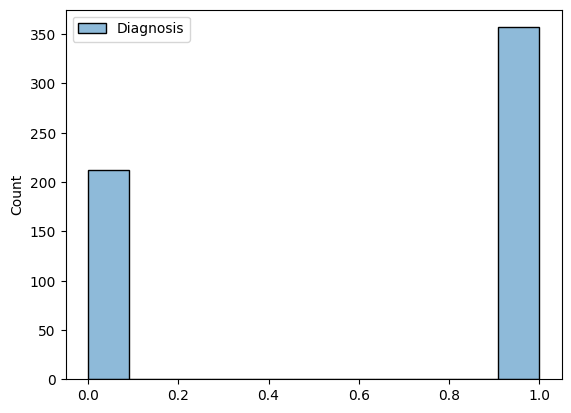

In [9]:
sns.histplot(y)

### Separando em treino  e teste

In [10]:

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


### Definindo os valores para o Grid Search

In [9]:

n_estimatores = [ i for i in range(10,121,20)]
max_depth = [4,6,8,10,None]
learning_rate = [round((1/(i)),5) for i in range(10,500,100)]

# ## 3. Definição dos Modelos e Parâmetros para Grid Search
# - Definir os parâmetros de busca para cada um dos modelos

# Definindo os parâmetros para cada modelo
param_grid_xgb = {
    'learning_rate': learning_rate,
    'max_depth': max_depth,
    'n_estimators': n_estimatores
}

param_grid_lgb = {
    'learning_rate': learning_rate,
    'max_depth': max_depth,
    'n_estimators': n_estimatores
}

param_grid_cat = {
    'learning_rate': learning_rate,
    'depth': max_depth,
    'iterations': n_estimatores
}

param_grid_gb = {
    'learning_rate': learning_rate,
    'max_depth': max_depth,
    'n_estimators': n_estimatores
}


In [10]:

def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        total_time_seconds =(datetime.now() - start_time).total_seconds()
        thour, temp_sec = divmod(total_time_seconds, 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))
        
        return total_time_seconds
    
time_estimatores= dict.fromkeyes(["xgb","lgb","cat","gb"])

In [14]:
param_grid_xgb

{'learning_rate': [0.1, 0.00909, 0.00476, 0.00323, 0.00244],
 'max_depth': [4, 6, 8, 10, None],
 'n_estimators': [10, 30, 50, 70, 90, 110]}

In [11]:

xgb = XGBClassifier(objective='binary:logistic', nthread=1)

# Aplicando Grid Search para cada modelo
print("Iniciando Grid Search para XGBoost...")
grid_search_xgb = GridSearchCV(xgb, param_grid_xgb,cv=10,scoring="f1" 
                               #,verbose=3
                               )

tot_time = timer()
grid_search_xgb.fit(X_train,y_train)
time_grid_search_xgb = timer(tot_time)
print(time_grid_search_xgb)

print(f"best parameter:{grid_search_xgb.best_params_} - best score:{grid_search_xgb.best_score_}")

best_xgb = grid_search_xgb.best_params_


Iniciando Grid Search para XGBoost...

 Time taken: 0 hours 2 minutes and 8.77 seconds.
128.771004
best parameter:{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 70} - best score:0.9781030173116709


In [12]:

lgb =LGBMClassifier(objective="binary",n_jobs=1)

grid_search_lgb = GridSearchCV(lgb, param_grid_lgb,cv=10,scoring="f1"
                               #,verbose=3
                               )

tot_time = timer()
grid_search_lgb.fit(X_train,y_train)
time_grid_search_lgb = timer(tot_time)
print(time_grid_search_lgb)

print(f"best parameter:{grid_search_lgb.best_params_} - best score:{grid_search_lgb.best_score_}")

best_lgb = grid_search_lgb.best_params_


[LightGBM] [Info] Number of positive: 224, number of negative: 134
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3588
[LightGBM] [Info] Number of data points in the train set: 358, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.625698 -> initscore=0.513806
[LightGBM] [Info] Start training from score 0.513806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [13]:


print("Iniciando Grid Search para CatBoost...")
cat =CatBoostClassifier(logging_level="Silent")

grid_search_cat = GridSearchCV(cat, param_grid_cat,cv=10,scoring="f1" 
                               #,verbose=3
                               )

tot_time = timer()
grid_search_cat.fit(X_train,y_train)
time_grid_search_cat = timer(tot_time)
print(time_grid_search_cat)

print(f"best parameter:{grid_search_cat.best_params_} - best score:{grid_search_cat.best_score_}")

best_cat = grid_search_cat.best_params_


Iniciando Grid Search para CatBoost...

 Time taken: 0 hours 22 minutes and 16.43 seconds.
1336.432184
best parameter:{'depth': 6, 'iterations': 110, 'learning_rate': 0.1} - best score:0.974029796533998


In [14]:


print("Iniciando Grid Search para Gradient Boosting...")
gb =GradientBoostingClassifier()

grid_search_gb = GridSearchCV(gb, param_grid_gb,cv=10,scoring="f1"
                              #,verbose=3
                              )

tot_time = timer()
grid_search_gb.fit(X_train,y_train)
time_grid_search_gb = timer(tot_time)
print(time_grid_search_gb)

print(f"best parameter:{grid_search_gb.best_params_} - best score:{grid_search_gb.best_score_}")

best_gb = grid_search_gb.best_params_

Iniciando Grid Search para Gradient Boosting...

 Time taken: 0 hours 6 minutes and 38.16 seconds.
398.162272
best parameter:{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 110} - best score:0.9655161655496898


In [22]:
best_parameters =pd.DataFrame(index=["xgb","lgb","cat","gb"],data=[best_xgb,best_lgb,best_cat,best_gb])
best_parameters.to_csv(path_or_buf=f"best_parameters_{file_prefix}.csv",sep=",")



In [23]:
time_grid_search = best_parameters =pd.DataFrame(index=["xgb","lgb","cat","gb"],data=[time_grid_search_xgb,time_grid_search_lgb,time_grid_search_cat,time_grid_search_gb])
time_grid_search.to_csv(path_or_buf=f"time_{file_prefix}.csv",sep=",")


In [24]:
best_parameters =pd.read_csv("best_parameters_cancer.csv",sep=",",index_col=[0])
best_parameters["depth"] = best_parameters["depth"]
best_parameters["max_depth"] = best_parameters["max_depth"]
best_parameters["iterations"] = best_parameters["iterations"]
best_parameters["n_estimators"] = best_parameters["n_estimators"]


best_xgb= best_parameters.loc["xgb"].dropna().to_dict()
best_lgb= best_parameters.loc["lgb"].dropna().to_dict()
best_cat= best_parameters.loc["cat"].dropna().to_dict()
best_gb= best_parameters.loc["gb"].dropna().to_dict()

best_xgb= { k: int(v) if k != "learning_rate" else v for k, v in best_xgb.items() }
best_lgb= { k: int(v) if k != "learning_rate" else v for k, v in best_lgb.items() }
best_cat= { k: int(v) if k != "learning_rate" else v for k, v in best_cat.items() }
best_gb= { k: int(v) if k != "learning_rate" else v for k, v in best_gb.items() }




In [27]:
xgb = XGBClassifier(objective='binary:logistic', **best_xgb)
xgb.fit(X_train,y_train)

lgb = LGBMClassifier(**best_lgb)
lgb.fit(X_train,y_train)

cat = CatBoostClassifier(**best_cat)
cat.fit(X_train,y_train)

gb = GradientBoostingClassifier(**best_gb)
gb.fit(X_train,y_train)

[LightGBM] [Info] Number of positive: 249, number of negative: 149
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3978
[LightGBM] [Info] Number of data points in the train set: 398, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.625628 -> initscore=0.513507
[LightGBM] [Info] Start training from score 0.513507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

GradientBoostingClassifier(max_depth=4, n_estimators=110)

In [28]:

# ## 5. Avaliação dos Modelos

# Função para avaliar os modelos
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(classification_report(y_test, y_pred))
    return y_pred

# Avaliar cada modelo
print("Avaliação do melhor modelo XGBoost")
y_pred_xgb = evaluate_model(xgb, X_test, y_test)

print("Avaliação do melhor modelo LightGBM")
y_pred_lgb = evaluate_model(lgb, X_test, y_test)

print("Avaliação do melhor modelo CatBoost")
y_pred_cat = evaluate_model(cat, X_test, y_test)

print("Avaliação do melhor modelo Gradient Boosting")
y_pred_gb = evaluate_model(gb, X_test, y_test)


Avaliação do melhor modelo XGBoost
              precision    recall  f1-score   support

           0       0.95      0.94      0.94        63
           1       0.96      0.97      0.97       108

    accuracy                           0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96       171

Avaliação do melhor modelo LightGBM
              precision    recall  f1-score   support

           0       0.94      0.92      0.93        63
           1       0.95      0.96      0.96       108

    accuracy                           0.95       171
   macro avg       0.94      0.94      0.94       171
weighted avg       0.95      0.95      0.95       171

Avaliação do melhor modelo CatBoost
              precision    recall  f1-score   support

           0       0.98      0.97      0.98        63
           1       0.98      0.99      0.99       108

    accuracy                           0.98       171
   macro avg       0.

In [29]:

# ## 6. Plotar a Matriz de Confusão do Melhor Modelo

# Função para plotar a matriz de confusão
def plot_confusion_matrix(y_test, y_pred, title):
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Matriz de Confusão - {title}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()


Plotando a Matriz de Confusão para XGBoost


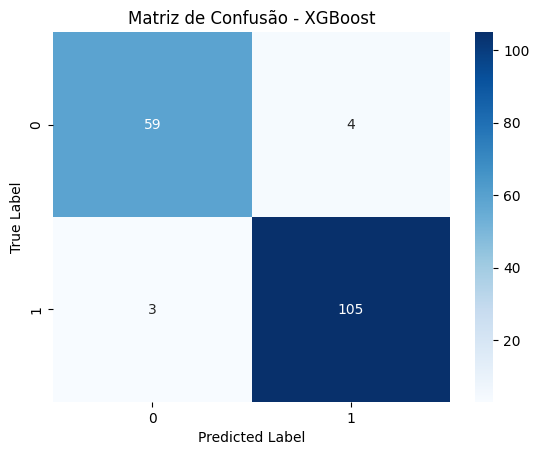

In [30]:

# Exemplo para o melhor modelo (substitua pelo modelo vencedor):
print("Plotando a Matriz de Confusão para XGBoost")
plot_confusion_matrix(y_test, y_pred_xgb, 'XGBoost')


Plotando a Matriz de Confusão para Lgb


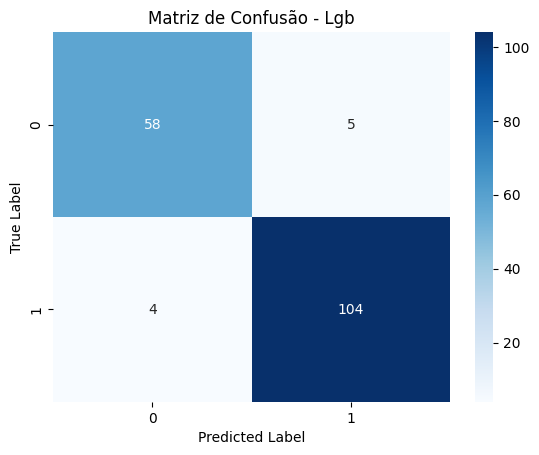

In [31]:
print("Plotando a Matriz de Confusão para Lgb")
plot_confusion_matrix(y_test, y_pred_lgb, 'Lgb')

Plotando a Matriz de Confusão para Cat


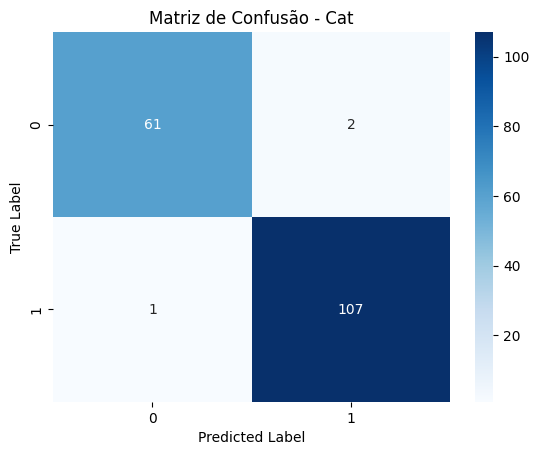

In [32]:
print("Plotando a Matriz de Confusão para Cat")
plot_confusion_matrix(y_test, y_pred_cat, 'Cat')

Plotando a Matriz de Confusão para GB


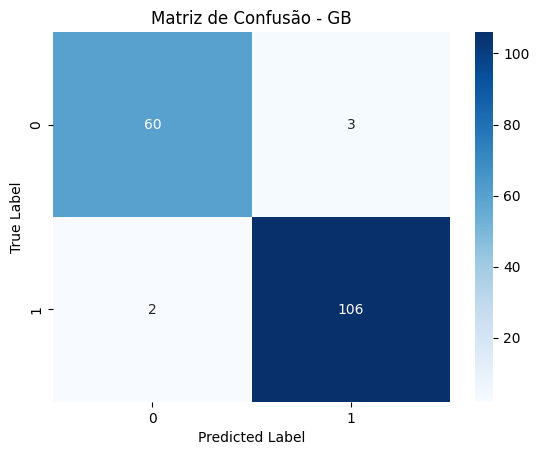

In [33]:
print("Plotando a Matriz de Confusão para GB")
plot_confusion_matrix(y_test, y_pred_gb, 'GB')

### Reapeated Kfold

In [ ]:
cross_val_cancer_scores={}

XGBoost

In [56]:
model = XGBClassifier(objective='binary:logistic', **best_xgb)

cv =RepeatedKFold(n_repeats=10,n_splits=10)
scoring =["accuracy","f1","precision","recall","roc_auc"]

cross_val_cancer_scores["xgb"] =cross_validate(model,X,y,cv=cv,scoring=["accuracy","f1","precision","recall","roc_auc"])

In [57]:
print("Média")
print(pd.DataFrame(cross_val_cancer_scores).mean(axis=0))
print()
print("Desvio Padrão")
print(pd.DataFrame(cross_val_cancer_scores).std(axis=0))


Média
fit_time          0.043330
score_time        0.026576
test_accuracy     0.965902
test_f1           0.972938
test_precision    0.965606
test_recall       0.980918
test_roc_auc      0.993170
dtype: float64

Desvio Padrão
fit_time          0.007802
score_time        0.003683
test_accuracy     0.025681
test_f1           0.020318
test_precision    0.029604
test_recall       0.021039
test_roc_auc      0.009219
dtype: float64


In [58]:
model = LGBMClassifier(**best_lgb)

cv =RepeatedKFold(n_repeats=10,n_splits=10)
scoring =["accuracy","f1","precision","recall","roc_auc"]

cross_val_cancer_scores["lgb"] =cross_validate(model,X,y,cv=cv,scoring=["accuracy","f1","precision","recall","roc_auc"])

[LightGBM] [Info] Number of positive: 320, number of negative: 192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5112
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.625000 -> initscore=0.510826
[LightGBM] [Info] Start training from score 0.510826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [59]:
print("Média")
print(pd.DataFrame(cross_val_cancer_scores).mean(axis=0))
print()
print("Desvio Padrão")
print(pd.DataFrame(cross_val_cancer_scores).std(axis=0))

Média
fit_time          0.027576
score_time        0.016314
test_accuracy     0.963430
test_f1           0.970953
test_precision    0.962309
test_recall       0.980689
test_roc_auc      0.991632
dtype: float64

Desvio Padrão
fit_time          0.004187
score_time        0.001692
test_accuracy     0.026212
test_f1           0.021057
test_precision    0.034700
test_recall       0.022968
test_roc_auc      0.012850
dtype: float64


In [60]:
model = CatBoostClassifier(**best_cat)

cv =RepeatedKFold(n_repeats=10,n_splits=10)
scoring =["accuracy","f1","precision","recall","roc_auc"]

cross_val_cancer_scores["cat"] =cross_validate(model,X,y,cv=cv,scoring=["accuracy","f1","precision","recall","roc_auc"])

0:	learn: 0.5282680	total: 9.39ms	remaining: 1.02s
1:	learn: 0.4261715	total: 12.5ms	remaining: 673ms
2:	learn: 0.3422971	total: 15.4ms	remaining: 549ms
3:	learn: 0.2866571	total: 19.3ms	remaining: 512ms
4:	learn: 0.2379726	total: 22.2ms	remaining: 466ms
5:	learn: 0.2049453	total: 25ms	remaining: 434ms
6:	learn: 0.1720861	total: 28.2ms	remaining: 414ms
7:	learn: 0.1546279	total: 30.9ms	remaining: 393ms
8:	learn: 0.1389243	total: 34.1ms	remaining: 383ms
9:	learn: 0.1222129	total: 37.4ms	remaining: 374ms
10:	learn: 0.1112286	total: 39.9ms	remaining: 359ms
11:	learn: 0.0984187	total: 42.2ms	remaining: 345ms
12:	learn: 0.0884819	total: 44.5ms	remaining: 332ms
13:	learn: 0.0812355	total: 46.7ms	remaining: 321ms
14:	learn: 0.0757224	total: 49.7ms	remaining: 315ms
15:	learn: 0.0701485	total: 56.1ms	remaining: 330ms
16:	learn: 0.0636930	total: 61.2ms	remaining: 335ms
17:	learn: 0.0586979	total: 66.1ms	remaining: 338ms
18:	learn: 0.0557437	total: 72.3ms	remaining: 346ms
19:	learn: 0.0512939	tot

In [61]:
print("Média")
print(pd.DataFrame(cross_val_cancer_scores).mean(axis=0))
print()
print("Desvio Padrão")
print(pd.DataFrame(cross_val_cancer_scores).std(axis=0))

Média
fit_time          0.313821
score_time        0.014543
test_accuracy     0.969107
test_f1           0.975367
test_precision    0.968293
test_recall       0.983154
test_roc_auc      0.993811
dtype: float64

Desvio Padrão
fit_time          0.022386
score_time        0.000797
test_accuracy     0.024192
test_f1           0.019884
test_precision    0.030527
test_recall       0.020528
test_roc_auc      0.009367
dtype: float64


In [62]:
model = GradientBoostingClassifier(**best_gb)

cv =RepeatedKFold(n_repeats=10,n_splits=10)
scoring =["accuracy","f1","precision","recall","roc_auc"]

cross_val_cancer_scores["gb"] =cross_validate(model,X,y,cv=cv,scoring=["accuracy","f1","precision","recall","roc_auc"])

In [63]:
print("Média")
print(pd.DataFrame(cross_val_cancer_scores).mean(axis=0))
print()
print("Desvio Padrão")
print(pd.DataFrame(cross_val_cancer_scores).std(axis=0))

Média
fit_time          0.522778
score_time        0.013223
test_accuracy     0.961147
test_f1           0.969514
test_precision    0.963885
test_recall       0.975977
test_roc_auc      0.991070
dtype: float64

Desvio Padrão
fit_time          0.006515
score_time        0.000440
test_accuracy     0.024304
test_f1           0.018248
test_precision    0.029053
test_recall       0.023281
test_roc_auc      0.010869
dtype: float64
